**DISCLAIMER: This homework was done on Google collab with permission from the instructor, to utilize the T4
GPU from Google, along with CUDA. However, let it be known that Google collab has an auto fill feature (similar
to that of Gmail autofill or on Google docs where it finishes sentences for you), which could autofill the code. I
wasn't able to find the setting to turn it off, however, I tried my best to adhere to the academic honesty policies.
Wherever autofill was used, I have cited it, but also primarily because it made sense to do the code that way.
However, all points of academic honesty was honored.**

In [67]:
import zipfile, os, pickle, torch, pickle
from torch.utils.data import Dataset
from torch.optim import Adamax
from torch.utils.data import DataLoader
from IPython.display import Audio
import numpy as np
import torch.nn as nn
import matplotlib.pyplot as plt
!pip install pretty_midi
import pretty_midi
!pip install tqdm #for progress bar in P3, added by the TA
from tqdm import tqdm

# **Part 1**

In [4]:
path_str = "/kaggle/input/irishdataset/irish_datasets/irish_train.pkl"
with open(path_str, "rb") as f: # Load the training data
    train_data = pickle.load(f)
print("Type:", type(train_data),"\nNumber of songs:", len(train_data),"\nFirst song type:", type(train_data[0]),"\nFirst 20 tokens of the first song:", train_data[0][:20])
#REFERENCE: https://github.com/seiichiinoue/odcnn/issues/6
#REFERENCE: https://github.com/oxpig/DeepCoy/blob/master/GGNN_DeepCoy.py
#REFERENCE: https://stackoverflow.com/questions/48841500/how-to-upload-my-dataset-into-google-colab
#REFERENCE: https://auto.gluon.ai/0.4.0/_modules/autogluon/vision/predictor/predictor.html

Type: <class 'list'> 
Number of songs: 7000 
First song type: <class 'numpy.ndarray'> 
First 20 tokens of the first song: [ 60. 128.  57. 128.  62. 128.  62. 128.  64. 128.  65. 128. 128. 128.
  65.  64.  62. 128.  60. 128.]


In [90]:
#THIS METHOD WAS COME UP WITH BY LOOKING AND RESEARCHING CODE ONLINE, REFERENCED BELOW
class Irish_Dataset(Dataset):
    def __init__(self, data, L_in=32):
        self.L_in = L_in
        val1 = list(range(48, 95)) + [128]
        self.val1_index = {}
        filtered_val2, val3, self.X, self.y = [], [], [], []
         # Create lookup tables: MIDI to index, and index to MIDI (for decoding later)
        self.midi_to_index = {midi: idx for idx, midi in enumerate(val1)}
        self.index_to_midi = {idx: midi for midi, idx in self.midi_to_index.items()}
        placeholder = 0
        for i in val1:  #Assign each note a placeholder index
            self.val1_index[i] = placeholder
            placeholder += 1
        val2 = np.concatenate(data).astype(int)        
        for t in val2: 
            if t in self.val1_index:
                filtered_val2.append(t)
        val2 = filtered_val2
        for t in val2:  # Map token indices
            index = self.val1_index[t]
            val3.append(index)
        for i in range(0, len(val3) - L_in, L_in):  #for training
            self.X.append(val3[i:i + L_in])
            self.y.append(val3[i + L_in])
        self.X, self.y  = torch.tensor(self.X, dtype=torch.long), torch.tensor(self.y, dtype=torch.long)

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]

#REFERENCE: https://github.com/craffel/pretty-midi
#REFERENCE: https://stackoverflow.com/questions/57340142/skkearn-tfidfvectorizer-user-warning-your-stop-words-may-be-inconsistent-with-y
#REFERENCE: https://stackoverflow.com/questions/41989950/numpy-concatenate-valueerror-all-the-input-arrays-must-have-same-number-o
#REFERENCE: https://stackoverflow.com/questions/56576716/pytorch-dataloader-fails-when-the-number-of-examples-are-not-exactly-divided-by THIS ONE OF GOOD

In [6]:
dataset = Irish_Dataset(train_data, L_in=32)  # Use songs or else
dataloader = DataLoader(dataset, batch_size=16, shuffle=True)
for sze1, sze2 in dataloader:
    print("Input shape (x):", sze1.shape,"\nTarget shape (y):", sze2.shape,"\nFirst input sequence (x[0]):", sze1[0],"\nFirst target label (y[0]):", sze2[0])
    break

# https://stackoverflow.com/questions/56576716/pytorch-dataloader-fails-when-the-number-of-examples-are-not-exactly-divided-by
# https://github.com/IraKorshunova/folk-rnn

Input shape (x): torch.Size([16, 32]) 
Target shape (y): torch.Size([16]) 
First input sequence (x[0]): tensor([29, 29, 47, 29, 29, 47, 26, 47, 23, 47, 19, 47, 21, 47, 23, 47, 24, 23,
        47, 24, 28, 47, 26, 47, 24, 47, 47, 47, 21, 19, 47, 16]) 
First target label (y[0]): tensor(12)


# **Part 2**

In [9]:
class MelodyLSTM(nn.Module):
    def __init__(self, input_size=48, hidden_size=512, num_layers=2, dropout=0.1, output_size=48):
        super(MelodyLSTM, self).__init__()
        self.lstm = nn.LSTM(input_size=input_size,hidden_size=hidden_size,num_layers=num_layers,batch_first=True)# Define the LSTM layer
        self.fc1 = nn.Linear(in_features=hidden_size, out_features=512)# First fully connected layer after LSTM
        self.dropout = nn.Dropout(p=dropout)# Dropout layer to prevent overfitting
        self.fc2 = nn.Linear(in_features=512, out_features=output_size)# Final output layer that maps to 48 classes (notes)

    def forward(self, x):
        lstm_output, (hidden_state, cell_state) = self.lstm(x)   # Step 1: Pass the input through the LSTM layer
        last_time_step_output = lstm_output[:, lstm_output.size(1) - 1, :]  # Step 2: Extract the last time step's output from the LSTM   # This is the output corresponding to the last element in the input sequence
        linear1_output = self.fc1(last_time_step_output) # Step 3: Pass through the first fully connected (linear) layer
        dropped_output = self.dropout(linear1_output) # Step 4: Apply dropout for regularization
        final_output = self.fc2(dropped_output)   # Step 5: Pass through the final output layer (no softmax, logits returned)
        return final_output
# https://github.com/mazzamani/LSTM_pytorch/blob/master/main.py
# https://github.com/AdalbertoCq/Deep-Learning-Specialization-Coursera/blob/master/Sequence%20Models/week1/LSTM%20Network/jazz_improv.py
# https://stackoverflow.com/questions/49466894/how-to-correctly-give-inputs-to-embedding-lstm-and-linear-layers-in-pytorch
# https://github.com/yunjey/pytorch-tutorial/blob/master/tutorials/02-intermediate/recurrent_neural_network/main.py
# https://github.com/pytorch/pytorch/blob/main/torch/nn/modules/rnn.py

In [10]:
model = MelodyLSTM()
sample_input = torch.rand(16, 32, 48)  # batch of 16, sequence length 32, one-hot size 48
output = model(sample_input)
print("Output shape:", output.shape)  # should be (16, 48)
# https://github.com/craffel/pretty-midi
# https://github.com/RichardYang40148/mgeval

Output shape: torch.Size([16, 48])


# **Part 3**

In [12]:
print(torch.cuda.is_available())
train_dataset = Irish_Dataset(train_data[:1000], L_in=32)
train_loader = DataLoader(train_dataset, batch_size=512, shuffle=True, pin_memory=True, num_workers=2)
path_str2 = "/kaggle/input/irishdataset/irish_datasets/irish_val.pkl"
with open(path_str2, "rb") as f:
    val_data = pickle.load(f)
val_dataset = Irish_Dataset(val_data[:200], L_in=32)
val_loader = DataLoader(val_dataset, batch_size=512, pin_memory=True, num_workers=2)
device = torch.device("cuda")
model = MelodyLSTM().to(device)
optimizer = Adamax(model.parameters(), lr=0.01)
criterion = nn.CrossEntropyLoss()
num_epochs = 100
train_losses, val_accuracies  = [], []
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for x, y in tqdm(train_loader):
        x1 = torch.nn.functional.one_hot(x.to(device), num_classes=48).float()
        optimizer.zero_grad()
        outputs = model(x1)
        criterion(outputs, y.to(device)).backward()
        optimizer.step()
        running_loss += criterion(outputs, y.to(device)).item()
    avg_loss = running_loss / len(train_loader)
    train_losses.append(avg_loss)
    model.eval()
    correct, total = 0, 0
    with torch.no_grad():
        for x_val, y_val in val_loader:
            x_val, y_val = x_val.to(device), y_val.to(device)
            x_val = torch.nn.functional.one_hot(x_val, num_classes=48).float()
            predicted = model(x_val).argmax(dim=1)
            correct += (predicted == y_val).sum().item()
            total += len(y_val)
    accuracy = correct / total
    val_accuracies.append(accuracy)
    print("Epoch", (epoch+1) ," - Loss: ", avg_loss , " - Val Accuracy: ", accuracy)
    
# https://tqdm.github.io/
# https://pytorch.org/tutorials/beginner/introyt/trainingyt.html
# https://pytorch.org/docs/stable/generated/torch.nn.CrossEntropyLoss.html
# https://pytorch.org/docs/stable/generated/torch.optim.Adamax.html
# https://pytorch.org/docs/stable/tensor_attributes.html#torch.torch.device
# https://pytorch.org/tutorials/beginner/basics/data_tutorial.html

True


100%|██████████| 915/915 [01:26<00:00, 10.61it/s]


Epoch 0.01  - Loss:  1.4178626777044412  - Val Accuracy:  0.6143247700052075


100%|██████████| 915/915 [01:34<00:00,  9.66it/s]


Epoch 0.02  - Loss:  1.1338100807914318  - Val Accuracy:  0.6460141468495053


100%|██████████| 915/915 [01:34<00:00,  9.65it/s]


Epoch 0.03  - Loss:  1.0514773050292594  - Val Accuracy:  0.6653792744315223


100%|██████████| 915/915 [01:34<00:00,  9.66it/s]


Epoch 0.04  - Loss:  0.9766280235488558  - Val Accuracy:  0.6746116125672627


100%|██████████| 915/915 [01:35<00:00,  9.62it/s]


Epoch 0.05  - Loss:  0.899420591911983  - Val Accuracy:  0.6822166290574553


100%|██████████| 915/915 [01:35<00:00,  9.59it/s]


Epoch 0.06  - Loss:  0.8108994878706385  - Val Accuracy:  0.6807737371984031


100%|██████████| 915/915 [01:35<00:00,  9.59it/s]


Epoch 0.07  - Loss:  0.707150568336737  - Val Accuracy:  0.6761629925360181


100%|██████████| 915/915 [01:36<00:00,  9.53it/s]


Epoch 0.08  - Loss:  0.6037309550196747  - Val Accuracy:  0.6699574726609964


100%|██████████| 915/915 [01:35<00:00,  9.57it/s]


Epoch 0.09  - Loss:  0.5034812366376158  - Val Accuracy:  0.6664641555285541


100%|██████████| 915/915 [01:35<00:00,  9.57it/s]


Epoch 0.1  - Loss:  0.427640328576656  - Val Accuracy:  0.6627538621767054


100%|██████████| 915/915 [01:35<00:00,  9.57it/s]


Epoch 0.11  - Loss:  0.3680083342914373  - Val Accuracy:  0.6594124283978476


100%|██████████| 915/915 [01:35<00:00,  9.57it/s]


Epoch 0.12  - Loss:  0.31254455644250567  - Val Accuracy:  0.6584794306544003


100%|██████████| 915/915 [01:36<00:00,  9.53it/s]


Epoch 0.13  - Loss:  0.2747827291162939  - Val Accuracy:  0.6613543655615345


100%|██████████| 915/915 [01:35<00:00,  9.57it/s]


Epoch 0.14  - Loss:  0.2424222408096647  - Val Accuracy:  0.655224787363305


100%|██████████| 915/915 [01:35<00:00,  9.56it/s]


Epoch 0.15  - Loss:  0.21566977992735273  - Val Accuracy:  0.6587398021176879


100%|██████████| 915/915 [01:35<00:00,  9.54it/s]


Epoch 0.16  - Loss:  0.19529491565266593  - Val Accuracy:  0.656320517271307


100%|██████████| 915/915 [01:35<00:00,  9.54it/s]


Epoch 0.17  - Loss:  0.17426808825770362  - Val Accuracy:  0.6549535670890471


100%|██████████| 915/915 [01:35<00:00,  9.54it/s]


Epoch 0.18  - Loss:  0.16210621957733332  - Val Accuracy:  0.6571450269050512


100%|██████████| 915/915 [01:35<00:00,  9.56it/s]


Epoch 0.19  - Loss:  0.1494257638363239  - Val Accuracy:  0.6521003298038535


100%|██████████| 915/915 [01:35<00:00,  9.58it/s]


Epoch 0.2  - Loss:  0.141896892794983  - Val Accuracy:  0.6594341260197882


100%|██████████| 915/915 [01:35<00:00,  9.57it/s]


Epoch 0.21  - Loss:  0.13254279098956961  - Val Accuracy:  0.6568087137649714


100%|██████████| 915/915 [01:35<00:00,  9.57it/s]


Epoch 0.22  - Loss:  0.1256938403543553  - Val Accuracy:  0.6564073077590696


100%|██████████| 915/915 [01:35<00:00,  9.56it/s]


Epoch 0.23  - Loss:  0.11858763737919552  - Val Accuracy:  0.6556153445582364


100%|██████████| 915/915 [01:35<00:00,  9.53it/s]


Epoch 0.24  - Loss:  0.11048158658821075  - Val Accuracy:  0.6558865648324944


100%|██████████| 915/915 [01:35<00:00,  9.62it/s]


Epoch 0.25  - Loss:  0.10696788409857151  - Val Accuracy:  0.6570473876063183


100%|██████████| 915/915 [01:35<00:00,  9.62it/s]


Epoch 0.26  - Loss:  0.10185408602809645  - Val Accuracy:  0.6554634612046519


100%|██████████| 915/915 [01:35<00:00,  9.62it/s]


Epoch 0.27  - Loss:  0.0947819738888024  - Val Accuracy:  0.6599874153792744


100%|██████████| 915/915 [01:35<00:00,  9.62it/s]


Epoch 0.28  - Loss:  0.08773618048576058  - Val Accuracy:  0.6563856101371289


100%|██████████| 915/915 [01:35<00:00,  9.63it/s]


Epoch 0.29  - Loss:  0.08979321981021941  - Val Accuracy:  0.657752560319389


100%|██████████| 915/915 [01:35<00:00,  9.62it/s]


Epoch 0.3  - Loss:  0.08538760077920768  - Val Accuracy:  0.6557346814789099


100%|██████████| 915/915 [01:34<00:00,  9.64it/s]


Epoch 0.31  - Loss:  0.07968438573466624  - Val Accuracy:  0.6596727998611353


100%|██████████| 915/915 [01:35<00:00,  9.57it/s]


Epoch 0.32  - Loss:  0.07019960722209163  - Val Accuracy:  0.6582733032459642


100%|██████████| 915/915 [01:35<00:00,  9.56it/s]


Epoch 0.33  - Loss:  0.07556689731227081  - Val Accuracy:  0.6594883700746398


100%|██████████| 915/915 [01:35<00:00,  9.56it/s]


Epoch 0.34  - Loss:  0.07426081058757553  - Val Accuracy:  0.6551271480645722


100%|██████████| 915/915 [01:35<00:00,  9.57it/s]


Epoch 0.35  - Loss:  0.07266127811999269  - Val Accuracy:  0.6555502516924145


100%|██████████| 915/915 [01:35<00:00,  9.55it/s]


Epoch 0.36  - Loss:  0.06961475279324693  - Val Accuracy:  0.6597053462940462


100%|██████████| 915/915 [01:35<00:00,  9.56it/s]


Epoch 0.37  - Loss:  0.06784800874079512  - Val Accuracy:  0.6560059017531679


100%|██████████| 915/915 [01:36<00:00,  9.52it/s]


Epoch 0.38  - Loss:  0.06866100550593575  - Val Accuracy:  0.661951050164902


100%|██████████| 915/915 [01:35<00:00,  9.54it/s]


Epoch 0.39  - Loss:  0.06608732471985569  - Val Accuracy:  0.6569388994966152


100%|██████████| 915/915 [01:35<00:00,  9.53it/s]


Epoch 0.4  - Loss:  0.06452954356339785  - Val Accuracy:  0.6587831973615692


100%|██████████| 915/915 [01:35<00:00,  9.57it/s]


Epoch 0.41  - Loss:  0.06358495826318941  - Val Accuracy:  0.658707255684777


100%|██████████| 915/915 [01:35<00:00,  9.59it/s]


Epoch 0.42  - Loss:  0.06296956113086698  - Val Accuracy:  0.657752560319389


100%|██████████| 915/915 [01:35<00:00,  9.60it/s]


Epoch 0.43  - Loss:  0.06065507572897471  - Val Accuracy:  0.6584685818434299


100%|██████████| 915/915 [01:35<00:00,  9.56it/s]


Epoch 0.44  - Loss:  0.058501343575657394  - Val Accuracy:  0.6606600416594341


100%|██████████| 915/915 [01:35<00:00,  9.53it/s]


Epoch 0.45  - Loss:  0.059120129599475144  - Val Accuracy:  0.6585879187641035


100%|██████████| 915/915 [01:35<00:00,  9.54it/s]


Epoch 0.46  - Loss:  0.05527417722153045  - Val Accuracy:  0.6625802812011804


100%|██████████| 915/915 [01:35<00:00,  9.56it/s]


Epoch 0.47  - Loss:  0.05590663249782526  - Val Accuracy:  0.6585336747092518


100%|██████████| 915/915 [01:35<00:00,  9.56it/s]


Epoch 0.48  - Loss:  0.05494046235670809  - Val Accuracy:  0.657481340045131


100%|██████████| 915/915 [01:35<00:00,  9.57it/s]


Epoch 0.49  - Loss:  0.05470571170963062  - Val Accuracy:  0.6561577851067523


100%|██████████| 915/915 [01:35<00:00,  9.56it/s]


Epoch 0.5  - Loss:  0.05359212225353946  - Val Accuracy:  0.6593690331539663


100%|██████████| 915/915 [01:35<00:00,  9.56it/s]


Epoch 0.51  - Loss:  0.05261780590714653  - Val Accuracy:  0.6582299080020829


100%|██████████| 915/915 [01:35<00:00,  9.55it/s]


Epoch 0.52  - Loss:  0.053103833080681624  - Val Accuracy:  0.6584468842214893


100%|██████████| 915/915 [01:35<00:00,  9.56it/s]


Epoch 0.53  - Loss:  0.05097989882418855  - Val Accuracy:  0.6574162471793091


100%|██████████| 915/915 [01:35<00:00,  9.56it/s]


Epoch 0.54  - Loss:  0.04989651439233067  - Val Accuracy:  0.6584468842214893


100%|██████████| 915/915 [01:35<00:00,  9.56it/s]


Epoch 0.55  - Loss:  0.049966241914493954  - Val Accuracy:  0.6584251865995487


100%|██████████| 915/915 [01:35<00:00,  9.56it/s]


Epoch 0.56  - Loss:  0.048637647400075784  - Val Accuracy:  0.6592279986113522


100%|██████████| 915/915 [01:35<00:00,  9.56it/s]


Epoch 0.57  - Loss:  0.046719398177508774  - Val Accuracy:  0.6616147370248221


100%|██████████| 915/915 [01:35<00:00,  9.56it/s]


Epoch 0.58  - Loss:  0.04726537357751138  - Val Accuracy:  0.6605949487936122


100%|██████████| 915/915 [01:35<00:00,  9.57it/s]


Epoch 0.59  - Loss:  0.04703229984950498  - Val Accuracy:  0.6584902794653706


100%|██████████| 915/915 [01:35<00:00,  9.57it/s]


Epoch 0.6  - Loss:  0.04635413287136236  - Val Accuracy:  0.659086964068738


100%|██████████| 915/915 [01:35<00:00,  9.58it/s]


Epoch 0.61  - Loss:  0.04542133720856303  - Val Accuracy:  0.6606925880923451


100%|██████████| 915/915 [01:35<00:00,  9.58it/s]


Epoch 0.62  - Loss:  0.042711753698951395  - Val Accuracy:  0.6585553723311925


100%|██████████| 915/915 [01:35<00:00,  9.54it/s]


Epoch 0.63  - Loss:  0.04328476389961653  - Val Accuracy:  0.6604213678180871


100%|██████████| 915/915 [01:35<00:00,  9.55it/s]


Epoch 0.64  - Loss:  0.04290662355049223  - Val Accuracy:  0.6587289533067175


100%|██████████| 915/915 [01:35<00:00,  9.57it/s]


Epoch 0.65  - Loss:  0.04197579293150475  - Val Accuracy:  0.6578718972400625


100%|██████████| 915/915 [01:35<00:00,  9.56it/s]


Epoch 0.66  - Loss:  0.0428485950414356  - Val Accuracy:  0.6603237285193543


100%|██████████| 915/915 [01:35<00:00,  9.53it/s]


Epoch 0.67  - Loss:  0.04209254006371716  - Val Accuracy:  0.6562662732164555


100%|██████████| 915/915 [01:35<00:00,  9.54it/s]


Epoch 0.68  - Loss:  0.0410995434246998  - Val Accuracy:  0.6560709946189898


100%|██████████| 915/915 [01:35<00:00,  9.56it/s]


Epoch 0.69  - Loss:  0.040914706091900344  - Val Accuracy:  0.6630576288838743


100%|██████████| 915/915 [01:35<00:00,  9.57it/s]


Epoch 0.7  - Loss:  0.04021994114746569  - Val Accuracy:  0.6598138344037493


100%|██████████| 915/915 [01:35<00:00,  9.57it/s]


Epoch 0.71  - Loss:  0.03948653720349806  - Val Accuracy:  0.658164815136261


100%|██████████| 915/915 [01:35<00:00,  9.56it/s]


Epoch 0.72  - Loss:  0.040120766748536804  - Val Accuracy:  0.6593690331539663


100%|██████████| 915/915 [01:35<00:00,  9.56it/s]


Epoch 0.73  - Loss:  0.038776158509887956  - Val Accuracy:  0.6575789793438639


100%|██████████| 915/915 [01:35<00:00,  9.55it/s]


Epoch 0.74  - Loss:  0.03938577141907942  - Val Accuracy:  0.6580997222704391


100%|██████████| 915/915 [01:35<00:00,  9.57it/s]


Epoch 0.75  - Loss:  0.03865757640960112  - Val Accuracy:  0.6552139385523347


100%|██████████| 915/915 [01:35<00:00,  9.57it/s]


Epoch 0.76  - Loss:  0.0377486843712465  - Val Accuracy:  0.6602369380315918


100%|██████████| 915/915 [01:35<00:00,  9.57it/s]


Epoch 0.77  - Loss:  0.037629869633196485  - Val Accuracy:  0.6619835965978129


100%|██████████| 915/915 [01:35<00:00,  9.57it/s]


Epoch 0.78  - Loss:  0.03526597142631768  - Val Accuracy:  0.6567219232772088


100%|██████████| 915/915 [01:35<00:00,  9.56it/s]


Epoch 0.79  - Loss:  0.03710431377276208  - Val Accuracy:  0.6588374414164208


100%|██████████| 915/915 [01:35<00:00,  9.55it/s]


Epoch 0.8  - Loss:  0.0372338754323418  - Val Accuracy:  0.6622548168720708


100%|██████████| 915/915 [01:35<00:00,  9.56it/s]


Epoch 0.81  - Loss:  0.036621899448864445  - Val Accuracy:  0.6620595382746051


100%|██████████| 915/915 [01:35<00:00,  9.54it/s]


Epoch 0.82  - Loss:  0.03657920260715192  - Val Accuracy:  0.6624392466585662


100%|██████████| 915/915 [01:35<00:00,  9.56it/s]


Epoch 0.83  - Loss:  0.03571180173150096  - Val Accuracy:  0.6586313140079847


100%|██████████| 915/915 [01:34<00:00,  9.63it/s]


Epoch 0.84  - Loss:  0.034971458831282914  - Val Accuracy:  0.6593364867210554


100%|██████████| 915/915 [01:35<00:00,  9.60it/s]


Epoch 0.85  - Loss:  0.0357507321780008  - Val Accuracy:  0.6581865127582017


100%|██████████| 915/915 [01:35<00:00,  9.61it/s]


Epoch 0.86  - Loss:  0.03498922786090136  - Val Accuracy:  0.6613652143725047


100%|██████████| 915/915 [01:35<00:00,  9.58it/s]


Epoch 0.87  - Loss:  0.03500676591946779  - Val Accuracy:  0.6606708904704044


100%|██████████| 915/915 [01:35<00:00,  9.56it/s]


Epoch 0.88  - Loss:  0.03518691660296885  - Val Accuracy:  0.6592388474223225


100%|██████████| 915/915 [01:35<00:00,  9.55it/s]


Epoch 0.89  - Loss:  0.03436375764997605  - Val Accuracy:  0.6566676792223572


100%|██████████| 915/915 [01:35<00:00,  9.56it/s]


Epoch 0.9  - Loss:  0.034054659138550686  - Val Accuracy:  0.658436035410519


100%|██████████| 915/915 [01:35<00:00,  9.54it/s]


Epoch 0.91  - Loss:  0.03389418689544246  - Val Accuracy:  0.6623090609269224


100%|██████████| 915/915 [01:35<00:00,  9.55it/s]


Epoch 0.92  - Loss:  0.0331988908202881  - Val Accuracy:  0.6587181044957473


100%|██████████| 915/915 [01:35<00:00,  9.56it/s]


Epoch 0.93  - Loss:  0.03360979885850204  - Val Accuracy:  0.6601609963547995


100%|██████████| 915/915 [01:35<00:00,  9.55it/s]


Epoch 0.94  - Loss:  0.032872394885094275  - Val Accuracy:  0.6578285019961813


100%|██████████| 915/915 [01:35<00:00,  9.54it/s]


Epoch 0.95  - Loss:  0.03381185705005064  - Val Accuracy:  0.6598897760805416


100%|██████████| 915/915 [01:35<00:00,  9.54it/s]


Epoch 0.96  - Loss:  0.03228393332737554  - Val Accuracy:  0.6594341260197882


100%|██████████| 915/915 [01:36<00:00,  9.53it/s]


Epoch 0.97  - Loss:  0.03335965921379667  - Val Accuracy:  0.6608987155007812


100%|██████████| 915/915 [01:35<00:00,  9.59it/s]


Epoch 0.98  - Loss:  0.031981133783612746  - Val Accuracy:  0.6600308106231557


100%|██████████| 915/915 [01:35<00:00,  9.59it/s]


Epoch 0.99  - Loss:  0.03229337034344958  - Val Accuracy:  0.6586855580628364


100%|██████████| 915/915 [01:35<00:00,  9.59it/s]


Epoch 1.0  - Loss:  0.03125589968880913  - Val Accuracy:  0.6604647630619684


Text(0.5, 1.0, 'Validation Accuracy vs Epochs')

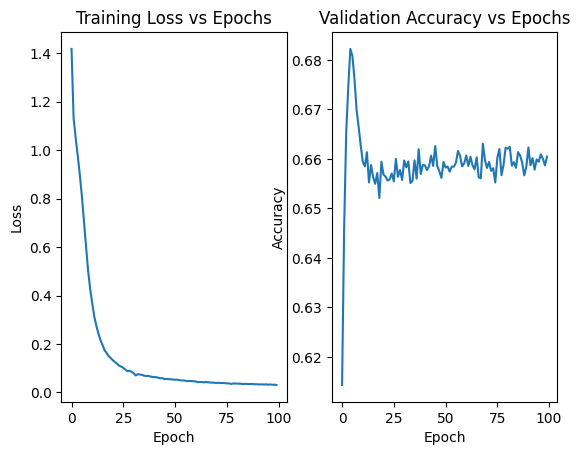

In [24]:
plt.subplot(1, 2, 1)
plt.plot(train_losses, label="Training Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training Loss vs Epochs")
plt.subplot(1, 2, 2)
plt.plot(val_accuracies, label="Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("Validation Accuracy vs Epochs")

# **Part 4**

In [36]:
test_path = "/kaggle/input/irishdataset/irish_datasets/irish_test.pkl"
with open(test_path, "rb") as f:
    test_data = pickle.load(f)

def predict_melody(model, seed_notes, output_len, input_len, note_to_idx, idx_to_note, device='cpu'):
    model.eval()
    note_indices, prediction = [], []
    for n in seed_notes:
        if n in note_to_idx:
            index = note_to_idx[n]
            note_indices.append(index)
    while len(note_indices) < output_len:
        latest_seq = note_indices[-input_len:]  # crop to last L_in notes
        input_tensor = torch.tensor(latest_seq, dtype=torch.long).unsqueeze(0).to(device)  # shape: (1, L_in)
        input_encoded = torch.nn.functional.one_hot(input_tensor, num_classes=48).float()  # shape: (1, L_in, 48)
        with torch.no_grad():
            logits = model(input_encoded)
            next_idx = torch.argmax(logits, dim=1).item()
        note_indices.append(next_idx)
    for i in note_indices:
        note = idx_to_note[i]
        prediction.append(note)
    return prediction
# https://docs.python.org/3/tutorial/datastructures.html#more-on-lists
# https://docs.python.org/3/library/stdtypes.html#dict
# https://stackoverflow.com/questions/62245173/pytorch-transform-tensor-to-one-hot

In [37]:
note_to_idx = train_dataset.val1_index
idx_to_note = {}
for midi, idx in note_to_idx.items():
    idx_to_note[idx] = midi
input_len = 32
for song_num, song_data in enumerate(test_data):
    midi_list = song_data.astype(int)
    initial_notes = []
    for n in midi_list:
        if n in note_to_idx:
            initial_notes.append(n)
    seed_input = initial_notes[:input_len]
    expected_length = len(initial_notes)
    melody = predict_melody(model=model,seed_notes=seed_input,output_len=expected_length,input_len=input_len,note_to_idx=note_to_idx,idx_to_note=idx_to_note,device=device)
    print("Generated Test Song ", song_num+1, "\nOriginal Length:", expected_length,"\nPreview (first 50 notes):", melody[:50])
# REFERENCE: https://stackoverflow.com/questions/483666/reverse-invert-a-dictionary-mapping
# REFERENCE: https://docs.python.org/3/tutorial/datastructures.html#list-comprehensions
# REFERENCE: https://pytorch.org/tutorials/beginner/blitz/cifar10_tutorial.html
# REFERENCE: https://stackoverflow.com/questions/62245173/pytorch-transform-tensor-to-one-hot

Generated Test Song  1 
Original Length: 64 
Preview (first 50 notes): [60, 62, 128, 128, 62, 128, 128, 60, 64, 67, 128, 128, 67, 128, 128, 72, 69, 128, 128, 72, 72, 128, 128, 69, 71, 74, 128, 128, 74, 128, 128, 67, 69, 128, 128, 128, 128, 128, 128, 128, 69, 128, 128, 69, 69, 128, 128, 72, 76, 83]
Generated Test Song  2 
Original Length: 512 
Preview (first 50 notes): [68, 128, 61, 128, 61, 128, 128, 128, 68, 128, 61, 128, 70, 128, 61, 128, 68, 128, 61, 128, 61, 128, 63, 128, 65, 128, 63, 128, 63, 128, 128, 128, 73, 128, 70, 128, 68, 128, 65, 128, 63, 128, 68, 128, 65, 128, 61, 128, 63, 128]
Generated Test Song  3 
Original Length: 1840 
Preview (first 50 notes): [68, 128, 77, 77, 77, 77, 73, 128, 65, 128, 72, 128, 70, 128, 68, 128, 68, 128, 77, 128, 128, 77, 77, 128, 128, 77, 73, 128, 128, 128, 65, 128, 66, 128, 77, 78, 77, 75, 73, 128, 72, 128, 68, 128, 70, 128, 66, 128, 65, 128]


# Part 5

In [117]:
def sequence_to_midi(midi_sequence, filename="generated.mid"):
    pm = pretty_midi.PrettyMIDI()
    instrument = pretty_midi.Instrument(program=0)
    current_note = None
    start_time = 0.0
    time_per_step = 0.25 / 4  # 16th note
    for i, note in enumerate(midi_sequence):
        if note == 128:
            continue
        else:
            if current_note is not None:
                end_time = i * time_per_step
                note_obj = pretty_midi.Note(velocity=100, pitch=current_note, start=start_time, end=end_time)
                instrument.notes.append(note_obj)
            current_note = note
            start_time = i * time_per_step
    if current_note is not None:
        end_time = len(midi_sequence) * time_per_step
        note_obj = pretty_midi.Note(velocity=100, pitch=current_note, start=start_time, end=end_time)
        instrument.notes.append(note_obj)
    pm.instruments.append(instrument)
    pm.write(filename)
def plot_melody(midi_sequence, title="Generated Melody", max_len=100):
    time_steps = range(len(midi_sequence[:max_len]))
    pitches = midi_sequence[:max_len]
    plt.figure()
    plt.plot(time_steps, pitches, marker='x')
    plt.title(title)
    plt.xlabel("Time Step (16th Notes)")
    plt.ylabel("MIDI Note")
def get_seed_sequence(test_song, note_to_idx, input_len):
    seed = []
    for n in test_song:
        if n in note_to_idx:
            seed.append(n)
        if len(seed) == input_len:
            break
    return seed

# https://github.com/craffel/pretty-midi
# https://craffel.github.io/pretty-midi/#pretty_midi.Note
# https://github.com/craffel/pretty-midi/issues/114

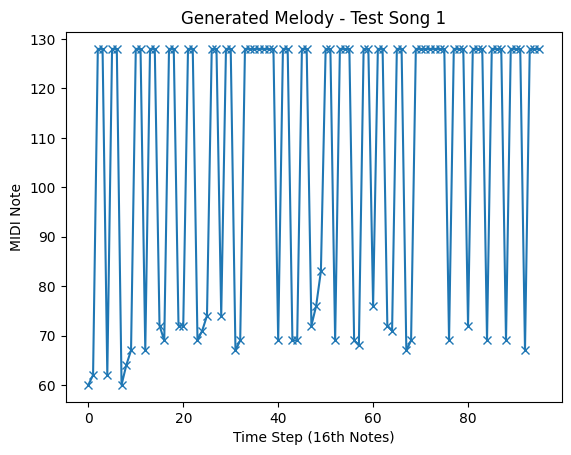

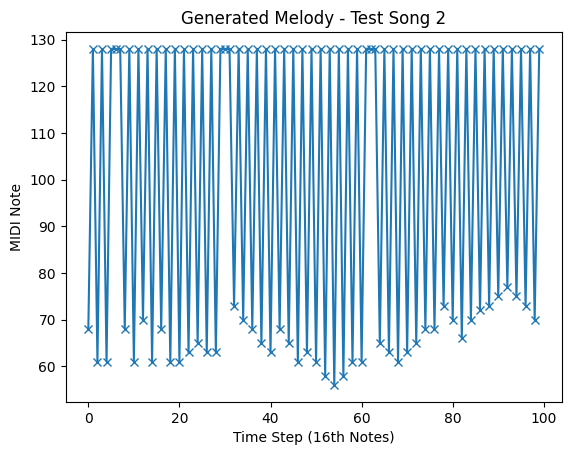

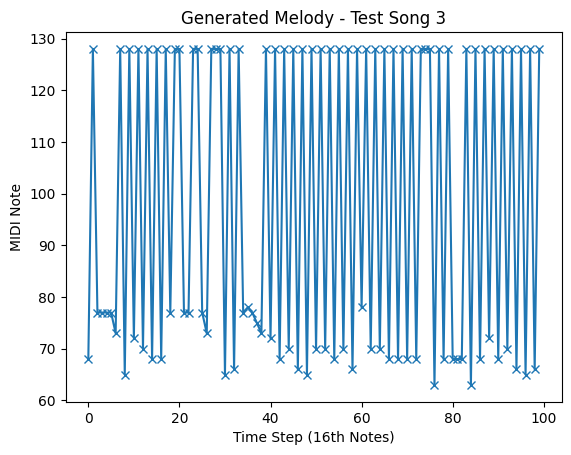

In [62]:
song1_seed = get_seed_sequence(test_data[0], note_to_idx, input_len)
song1 = predict_melody(model, song1_seed, len(song1_seed) + 64, input_len, note_to_idx, idx_to_note, device=device)
plot_melody(song1, title="Generated Melody - Test Song 1")
sequence_to_midi(song1, filename="generated_test1.mid")
song2_seed = get_seed_sequence(test_data[1], note_to_idx, input_len)
song2 = predict_melody(model, song2_seed, len(song2_seed) + 512, input_len, note_to_idx, idx_to_note, device=device)
plot_melody(song2, title="Generated Melody - Test Song 2")
sequence_to_midi(song2, filename="generated_test2.mid")
song3_seed = get_seed_sequence(test_data[2], note_to_idx, input_len)
song3 = predict_melody(model, song3_seed, len(song3_seed) + 1840, input_len, note_to_idx, idx_to_note, device=device)
plot_melody(song3, title="Generated Melody - Test Song 3")
sequence_to_midi(song3, filename="generated_test3.mid")

# https://docs.python.org/3/tutorial/datastructures.html#list-comprehensions
# https://pytorch.org/docs/stable/generated/torch.nn.functional.one_hot.html
# https://pytorch.org/docs/stable/tensors.html#torch.Tensor.to

In [63]:
def play_midi(filename):
    pm = pretty_midi.PrettyMIDI(filename)
    audio = pm.synthesize()
    return Audio(audio, rate=22050)
print("Test Song 1")
display(play_midi("generated_test1.mid"))
print("Test Song 2")
display(play_midi("generated_test2.mid"))
print("Test Song 3")
display(play_midi("generated_test3.mid"))
#reference: https://github.com/craffel/pretty-midi/blob/main/Tutorial.ipynb
#reference: https://craffel.github.io/pretty-midi/

Test Song 1


Test Song 2


Test Song 3


Description: As the test songs progressed from Song 1 to Song 3, there were noticeable changes in both their structure and musical characteristics. The length of the generated songs increased significantly, allowing for more variety and complexity in the melodies. Additionally, the rhythmic intensity appeared to increase, with later songs—especially Test Song 3—containing more notes per second, creating a faster tempo and more energetic phrasing compared to the earlier, slower-paced songs. The variety of pitch classes also expanded; while Song 1 relied on a limited set of repeated notes, the later songs introduced a broader pitch range and more dynamic transitions. This progression not only showcased longer sequences but also reflected increased melodic diversity, rhythmic complexity, and overall musical richness.

# Part 6

In [121]:
def inter_onset_intervals(sequence):
    onset_positions = [i for i, note in enumerate(sequence) if note != 128]
    if len(onset_positions) < 2:
        return [0]
    return np.diff(onset_positions)
def average_ioi(seq):
    ioi = inter_onset_intervals(seq)
    return np.mean(ioi) if len(ioi) > 0 else 0
def pitch_class_histogram(sequence):
    histogram = np.zeros(12)
    for note in sequence:
        if note != 128:
            pitch_class = int(note) % 12
            histogram[pitch_class] += 1
    total = np.sum(histogram)
    return histogram / total if total > 0 else histogram
def average_pitch_interval(sequence):
    differences = []
    previous = None
    for note in sequence:
        if note == 128:
            continue
        if previous is not None:
            differences.append(abs(note - previous))
        previous = note
    return np.mean(differences) if differences else 0
def note_count(sequence):
    return sum(1 for note in sequence if note != 128)
def evaluate_metrics(gt_seq, gen_seq, title_prefix="Test Song", window=32):
    def clean_notes(seq):
        return [int(n) for n in seq if int(n) != 128]
    gt_notes = clean_notes(gt_seq)
    gen_notes = clean_notes(gen_seq)
    gt_pch = pitch_class_histogram(gt_notes)
    gen_pch = pitch_class_histogram(gen_notes)
    plt.figure(figsize=(10,3))
    plt.bar(np.arange(12) - 0.2, gt_pch, width=0.4, label="Ground Truth")
    plt.bar(np.arange(12) + 0.2, gen_pch, width=0.4, label="Generated")
    plt.xticks(np.arange(12), ['C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 'B'])
    plt.title(f"{title_prefix} - Pitch Class Histogram")
    plt.legend()
    plt.grid(True)
    plt.show()
    def metric_over_time(seq, fn, window):
        return [fn(seq[i:i + window]) for i in range(0, len(seq) - window, window)]
    def plot_metric(gt, gen, label):
            plt.figure(figsize=(10, 3))
            plt.plot(range(len(gt)), gt, label="Ground Truth")
            plt.plot(range(len(gen)), gen, label="Generated")
            plt.title(f"{title_prefix} - {label}")
            plt.xlabel("Window")
            plt.ylabel(label)
    metrics = {"Average Pitch Interval": average_pitch_interval,"Note Count": note_count,"Average IOI": average_ioi}
    for label, fn in metrics.items():
        gt_vals = metric_over_time(gt_notes, fn, window)
        gen_vals = metric_over_time(gen_notes, fn, window)
        plot_metric(gt_vals, gen_vals, label)

# https://musicinformatics.gatech.edu/wp-content_nondefault/uploads/2018/11/postprint.pdf
# https://github.com/RichardYang40148/mgeval
# https://en.wikipedia.org/wiki/Pitch_class
# Reference: https://numpy.org/doc/stable/reference/
# Reference: https://matplotlib.org/stable/users/prev_whats_new/whats_new_3.1.0.html#new-style-plotting

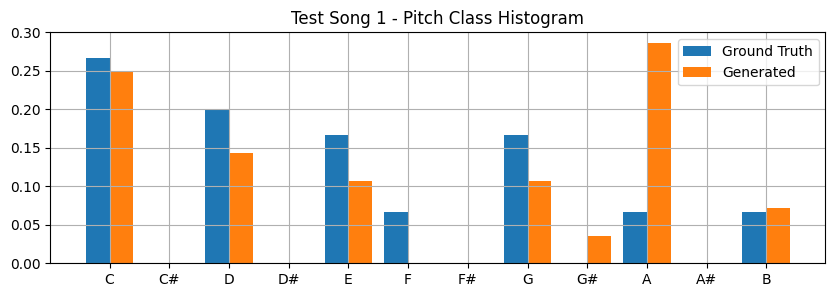


Test Song 1 
GT length: 64 
Generated length: 64 
GT preview: [60.0, 62.0, 128.0, 128.0, 62.0, 128.0, 128.0, 60.0, 64.0, 67.0] 
Generated preview: [60, 62, 128, 128, 62, 128, 128, 60, 64, 67]


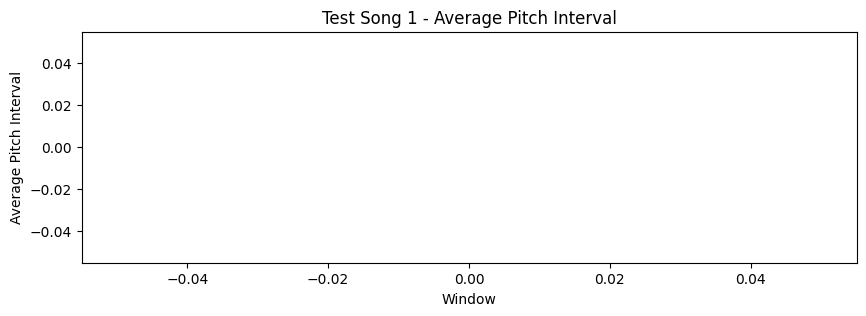

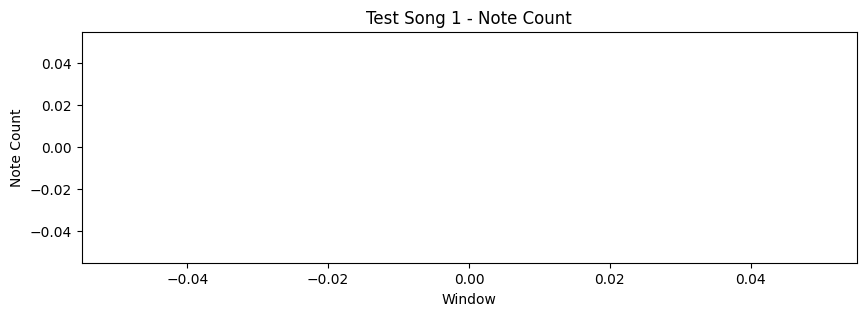

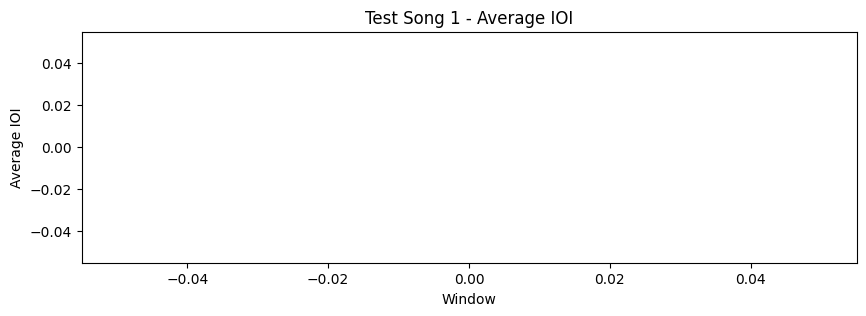

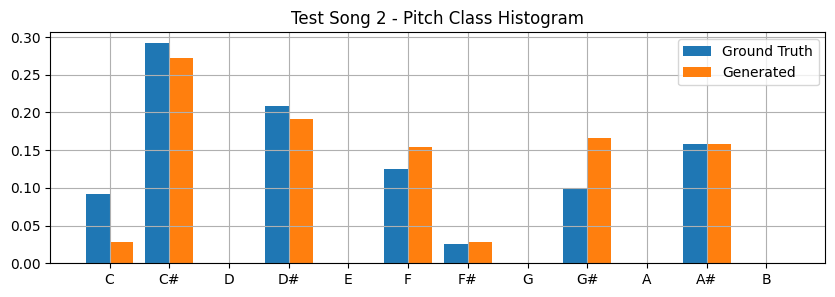


Test Song 2 
GT length: 512 
Generated length: 512 
GT preview: [68.0, 128.0, 61.0, 128.0, 61.0, 128.0, 128.0, 128.0, 68.0, 128.0] 
Generated preview: [68, 128, 61, 128, 61, 128, 128, 128, 68, 128]


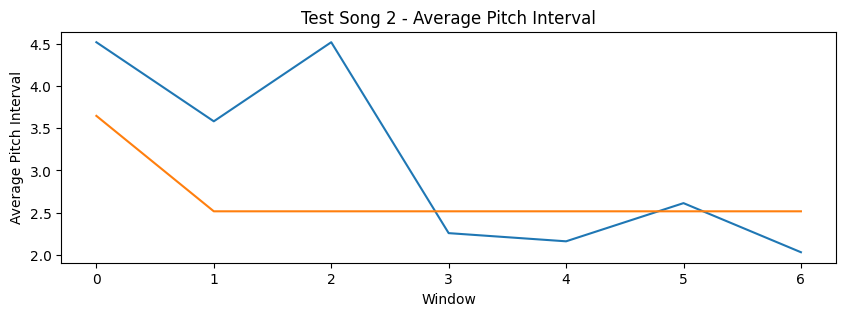

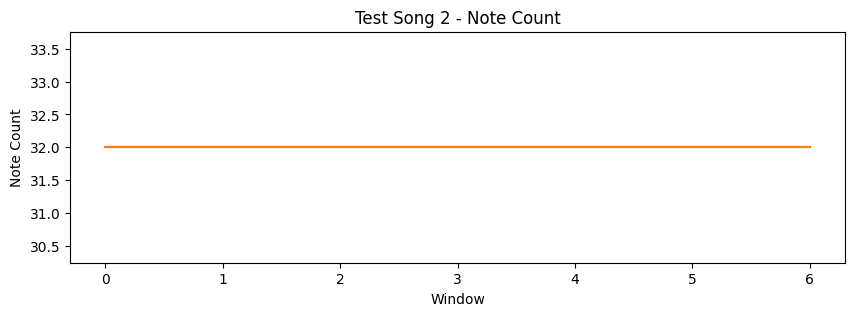

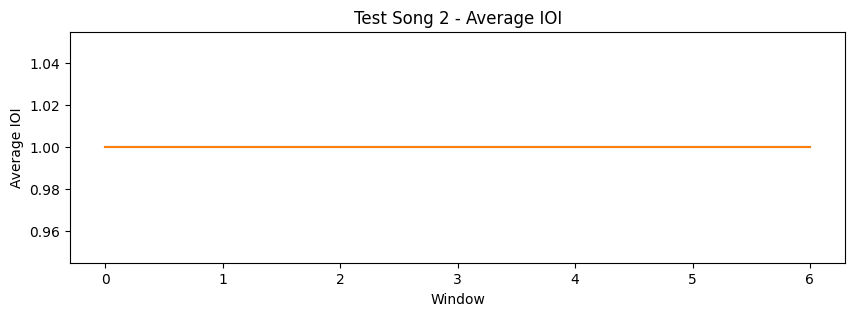

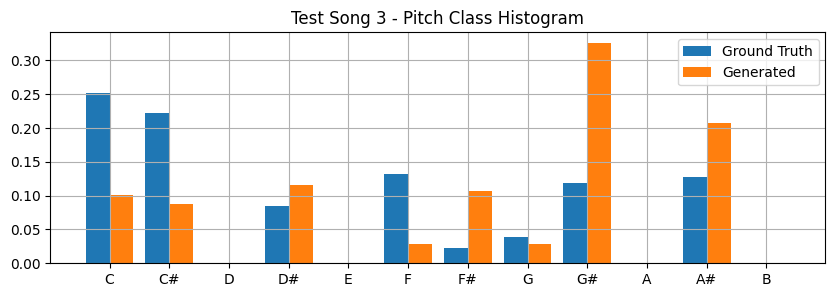


Test Song 3 
GT length: 1840 
Generated length: 1840 
GT preview: [68.0, 128.0, 77.0, 77.0, 77.0, 77.0, 73.0, 128.0, 65.0, 128.0] 
Generated preview: [68, 128, 77, 77, 77, 77, 73, 128, 65, 128]


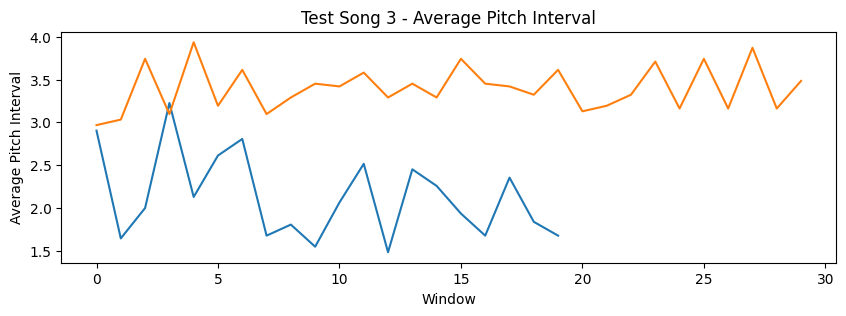

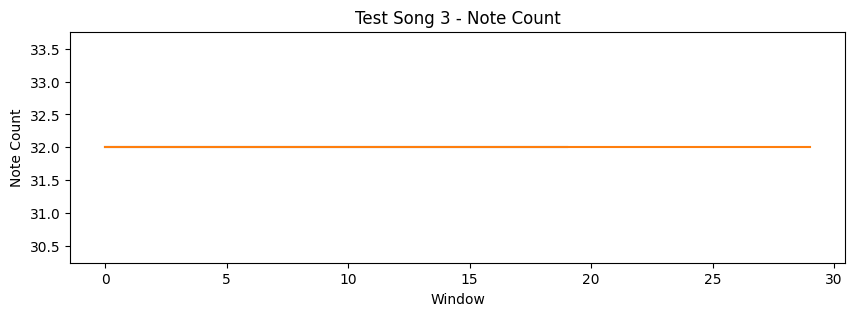

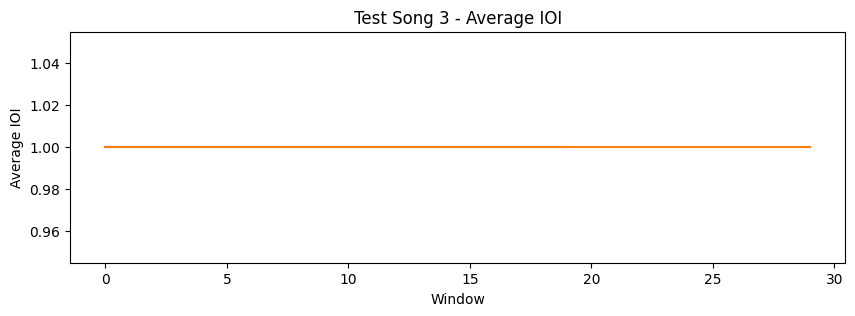

In [129]:
with open("/kaggle/input/irishdataset/irish_datasets/irish_test.pkl", "rb") as f:
    test_data = pickle.load(f)

train_dataset = Irish_Dataset(train_data, L_in=32)
midi_to_index = train_dataset.midi_to_index
index_to_midi = {v: k for k, v in midi_to_index.items()}
def clean_sequence(song, midi_to_index):
    return [n for n in song if n in midi_to_index]
for i in range(3):
    gt_sequence = clean_sequence(test_data[i], midi_to_index)
    seed = gt_sequence[:32]
    target_len = len(gt_sequence)
    generated_sequence = generate_melody(model=model,seed_seq=seed,target_len=target_len,L_in=32,midi_to_index=midi_to_index,index_to_midi=index_to_midi,device=device)
    evaluate_metrics(gt_sequence, generated_sequence, f"Test Song {i+1}", window=32)
    print("\nTest Song", i+1,"\nGT length:", len(gt_sequence),"\nGenerated length:", len(generated_sequence),"\nGT preview:", gt_sequence[:10],"\nGenerated preview:", generated_sequence[:10])

# Reference: https://docs.python.org/3/library/pickle.html
# Reference: https://pytorch.org/tutorials/beginner/data_loading_tutorial.html
# https://docs.python.org/3/tutorial/datastructures.html#dictionaries
# Reference: Similar strategy used in MIDI music preprocessing
# https://github.com/salu133445/melnet/blob/master/dataloader.py
# Reference: https://magenta.tensorflow.org/music-vae
# Also see: https://github.com/salu133445/GRUV/blob/master/src/train.py
# Reference: https://matplotlib.org/stable/gallery/index.html

**DISCLAIMER: Baotang told me there was some error on the way I did my code for the pitch interval, but I am about to run out of computing power and this is all I have, so please accept this humble offering (this hw) from a your subject(student)**

**The first song had some issue with projection and I ran out of computing power**

Across Test Songs 1 to 3, the generated melodies show a clear increase in complexity and tonal diversity. Test Song 1 has no graph unfortunately, while Songs 2 and 3 expand across more pitch classes, with Song 3 being the most diverse. Average Pitch Interval (PI) modest changes in Song 2, and more dynamic shifts in Song 3, indicating richer melodic development. Note Count (NC) remains uniform in Songs 2 and 3, suggesting rhythmic consistency, though at the cost of sounding mechanical. Average Inter-Onset Interval (IOI) also shows more rhythmic variation in the ground truths than in the generated versions, especially for Song 3. Overall, while longer sequences result in better tonal and structural variety, the generated melodies still lack the natural expressiveness of human-composed music, particularly in rhythm.








